In [ ]:
"""
Setting for google colab
"""
# The path of your project on google drive
path_project = "/content/drive/MyDrive/cartography msc/Thesis TUM 2024/momepy/"

# Connect colab with google drive
from google.colab import drive
drive.mount('/content/drive')

# Set the project path as current working directory
import os
os.chdir(path_project)
print("Current files under the working directory:", os.listdir())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Current files under the working directory: ['case_studies.csv', 'cache', 'case_studies3.csv', 'Brasilia.gpkg', 'results', '01_morphometrics.ipynb', 'case_studies.gsheet', 'Asu.csv', 'Case_of_studies.gsheet', 'slums.csv', 'morphometrics_slums.ipynb', 'examples.ipynb', 'Chacarita_morphometrics.ipynb', 'Africa_Katanga_Morphometrics.ipynb', 'Southametica_Bañado Sur_Morphometrics.ipynb', 'tree.dot', 'joined_data.csv', 'buildings_data.csv', 'Asia_Korail_Morphometrics.ipynb', 'merged_df.csv', 'slums.gsheet']


# Imports

In [ ]:
!pip install momepy
!pip install osmnx
!pip install PyDrive
!pip install clustergram
!pip install folium matplotlib mapclassify
!pip install shapely
!pip install matplotlib-scalebar
!pip install basemap




import pandas as pd
import geopandas as gpd
import networkx as nx
import numpy as np
import momepy as mm
import pyproj
import osmnx as ox
import libpysal
from shapely.geometry import box
from time import time
from clustergram import Clustergram
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib_scalebar.scalebar import ScaleBar
from mpl_toolkits.basemap import Basemap
from bokeh.io import output_notebook
from bokeh.plotting import show
from scipy.spatial.distance import euclidean
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, classification_report
import seaborn as sns
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

from shapely import LineString
from shapely.geometry import Point

# Usage of osmnx to get the data

In [ ]:
point = (23.784425, 90.408570)
dist = 700
gdf = ox.geometries.geometries_from_point(point, dist=dist, tags={'building':True})
gdf2 = ox.geometries.geometries_from_point(point, dist=dist, tags={'residential':['irregular_settlement']})
gdf_projected = ox.projection.project_gdf(gdf)
gdf_projected_2 = ox.projection.project_gdf(gdf2)
buildings = gdf_projected[gdf_projected.geom_type.isin(['Polygon', 'MultiPolygon'])]
Korail = gdf_projected_2[gdf_projected_2.geom_type.isin(['Polygon', 'MultiPolygon'])]

buildings['uID'] = mm.unique_id(buildings)
Korail['uID'] = mm.unique_id(Korail)
limit = mm.buffered_limit(buildings) # this define limit for momepy.Tessellation as a buffer around buildings.
tessellation = mm.Tessellation(buildings, unique_id='uID', limit=limit).tessellation

# Ensure that Korail is a single polygon (dissolve if there are multiple polygons)
Korail_union = Korail.unary_union

<ipython-input-3-04bb7056b393>:3: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf = ox.geometries.geometries_from_point(point, dist=dist, tags={'building':True})
<ipython-input-3-04bb7056b393>:4: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf2 = ox.geometries.geometries_from_point(point, dist=dist, tags={'residential':['irregular_settlement']})
/usr/local/lib/python3.10/dist-packages/geopan

Inward offset...
Generating input point array...
Generating Voronoi diagram...
Generating GeoDataFrame...
Dissolving Voronoi polygons...


<ipython-input-3-04bb7056b393>:13: UserWarning: Tessellation does not fully match buildings. 11 element(s) collapsed during generation - unique_id: {591, 7631, 8850, 8793, 9376, 8674, 8877, 9198, 9325, 9326, 9202}.
  tessellation = mm.Tessellation(buildings, unique_id='uID', limit=limit).tessellation


In [ ]:
print(buildings.crs)

EPSG:32646


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
#Number of buildings obtained for training dataset
total_buildings = len(buildings)
print(f"Total number of buildings: {total_buildings}")

Total number of buildings: 10709


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


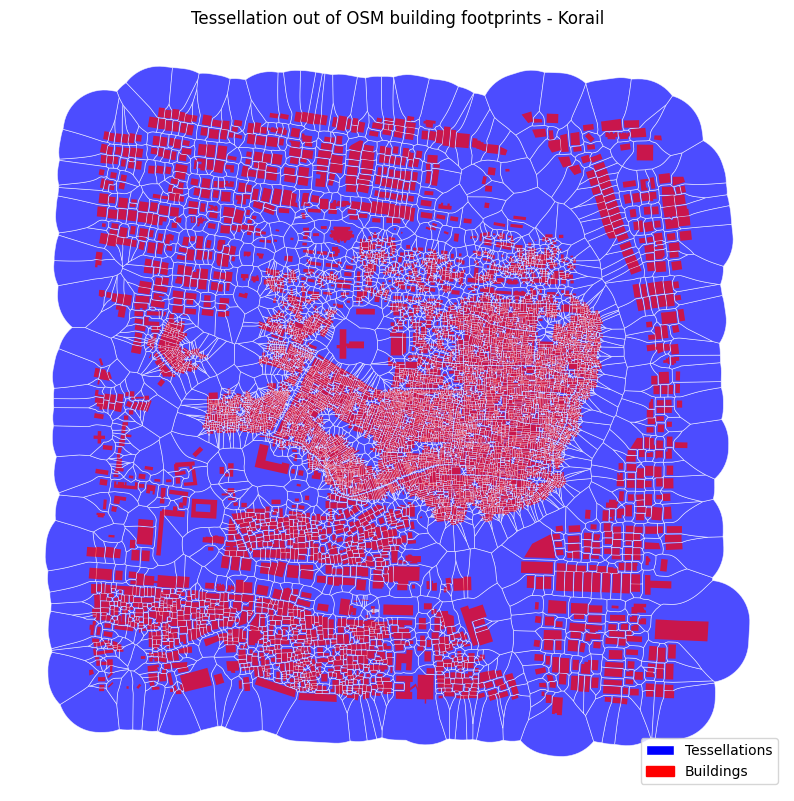

In [ ]:

# Create the plot
f, ax = plt.subplots(figsize=(10, 10))
tessellation.plot(ax=ax, edgecolor='white', linewidth=0.5, facecolor='blue', alpha=.7)
# Korail.plot(ax=ax, edgecolor='yellow', facecolor='none', linewidth=3)
buildings.plot(ax=ax, color='red', alpha=.7)

# Create legend patches
legend_elements = [
    Patch(facecolor='blue', edgecolor='white', label='Tessellations'),
    Patch(facecolor='red', edgecolor='red', label='Buildings')
]

# Add the legend to the plot
ax.legend(handles=legend_elements, loc='lower right')

# Title and axis off
plt.title('Tessellation out of OSM building footprints - Korail')
ax.set_axis_off()
plt.show()



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


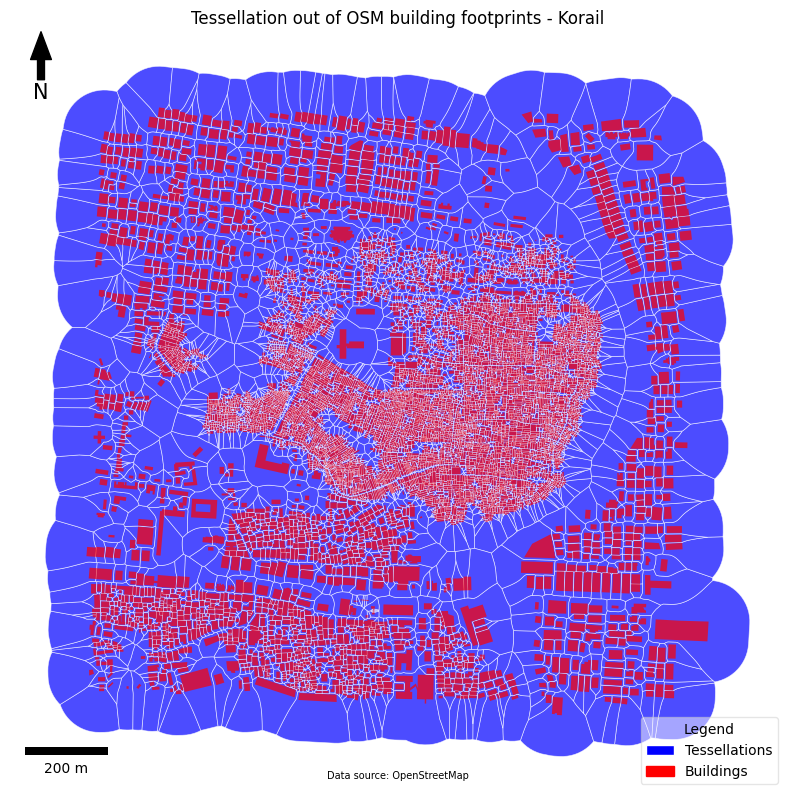

In [ ]:


# Create the plot
f, ax = plt.subplots(figsize=(10, 10))
tessellation.plot(ax=ax, edgecolor='white', linewidth=0.5, facecolor='blue', alpha=.7)
# Korail.plot(ax=ax, edgecolor='yellow', facecolor='none', linewidth=3)
buildings.plot(ax=ax, color='red', alpha=.7)

# Create legend patches
legend_elements = [
    Patch(facecolor='blue', edgecolor='white', label='Tessellations'),
    Patch(facecolor='red', edgecolor='red', label='Buildings')
]

# Add the legend to the plot

legend = ax.legend(handles=legend_elements, loc='lower right', framealpha=0.5, title='Legend')

# Add scale bar
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)


# Add north arrow
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black',  headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Title and axis off
plt.title('Tessellation out of OSM building footprints - Korail')
ax.set_axis_off()
plt.show()

## Areas
Building areas

In [ ]:
blg_area = mm.Area(buildings)
buildings['area'] = blg_area.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-8-0e5a57a77097>:1: FutureWarning: `momepy.Area` is deprecated. Replace it with `.area` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  blg_area = mm.Area(buildings)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bo

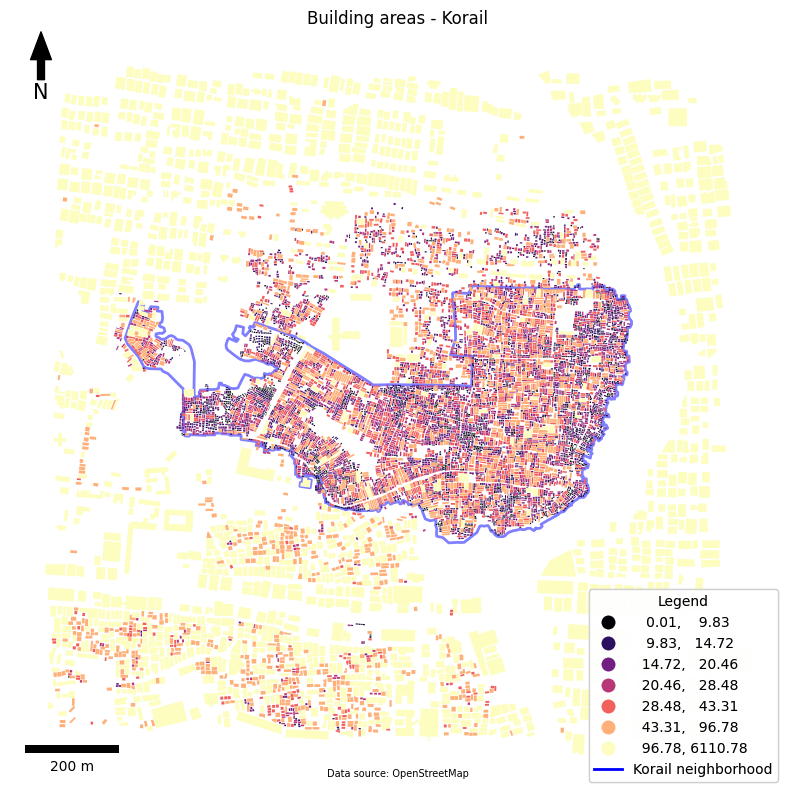

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

# Plot Korail edges
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', alpha=0.5, linewidth=2)

# Plot buildings with area column and legend
buildings_plot = buildings.plot(ax=ax, column='area', legend=True, scheme='quantiles', k=7, cmap='magma',
                                legend_kwds={'loc': 'lower right', 'title': "Building Area (Quantiles)"})

# Manually create a legend entry for the Korail plot
korail_legend = Line2D([0], [0], color='blue', lw=2, label='Korail neighborhood')

ax.set_axis_off()

# Retrieve the existing legend from the buildings plot
leg = ax.get_legend()

# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []

# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')

# Remove the previous legend to avoid duplicates
leg.remove()

# Create combined legend with a title
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)



# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Show the plot
plt.title('Building areas - Korail')  # Adding a title to the plot
plt.show()

# Perimeters

In [ ]:
buildings['perimeter'] = mm.Perimeter(buildings).series
buildings.perimeter[0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-10-04f7264ccdaa>:1: FutureWarning: `momepy.Perimeter` is deprecated. Replace it with `.length` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  buildings['perimeter'] = mm.Perimeter(buildings).series
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key

352.73087564296867

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-11-30a5caae4eaa>:20: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


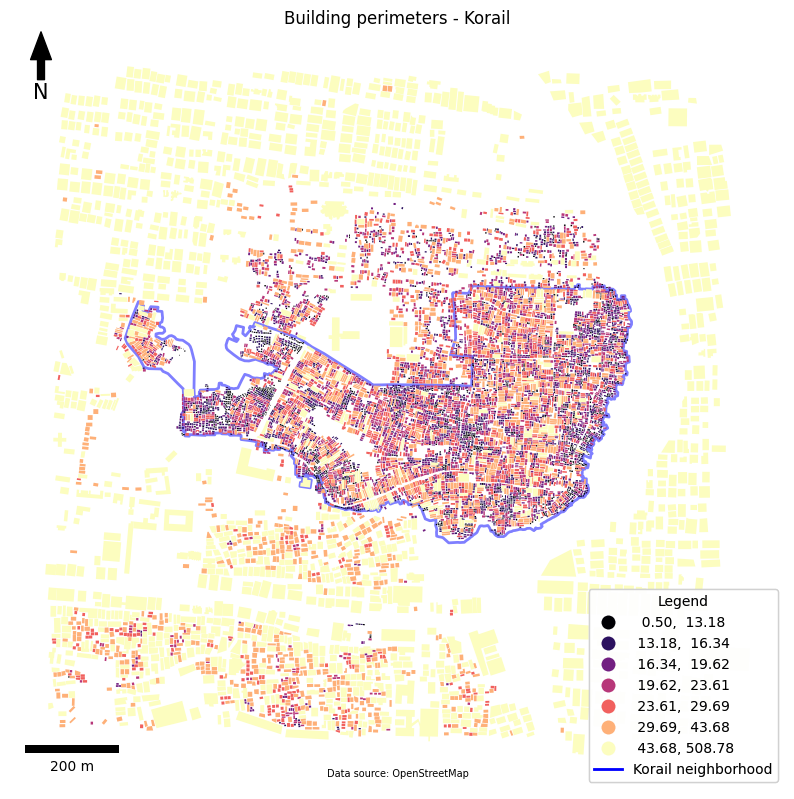

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

# Plot Korail edges
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', alpha=0.5, linewidth=2)

# Plot buildings with area column and legend
buildings_plot = buildings.plot(ax=ax, column='perimeter', legend=True, scheme='quantiles', k=7, cmap='magma',
                                legend_kwds={'loc': 'lower right', 'title': "Building Area (Quantiles)"})

# Manually create a legend entry for the Korail plot
korail_legend = Line2D([0], [0], color='blue', lw=2, label='Korail neighborhood')

ax.set_axis_off()

# Retrieve the existing legend from the buildings plot
leg = ax.get_legend()

# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []

# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')

# Remove the previous legend to avoid duplicates
leg.remove()

# Create combined legend with a title
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)



# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Show the plot
plt.title('Building perimeters - Korail')  # Adding a title to the plot
plt.show()

# Longest Axis Length

Calculates the length of the longest axis of object. Axis is defined as a diameter of minimal circumscribed circle around the convex hull

In [ ]:
buildings['lal'] = mm.LongestAxisLength(buildings).series
buildings.lal[0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-12-e61e99142893>:1: FutureWarning: Class based API like `momepy.LongestAxisLength` is deprecated. Replace it with `momepy.longest_axis_length` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['lal'] = mm.LongestAxisLength(buildings).series
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

137.57359982368334

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-13-b818cab2cdac>:19: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


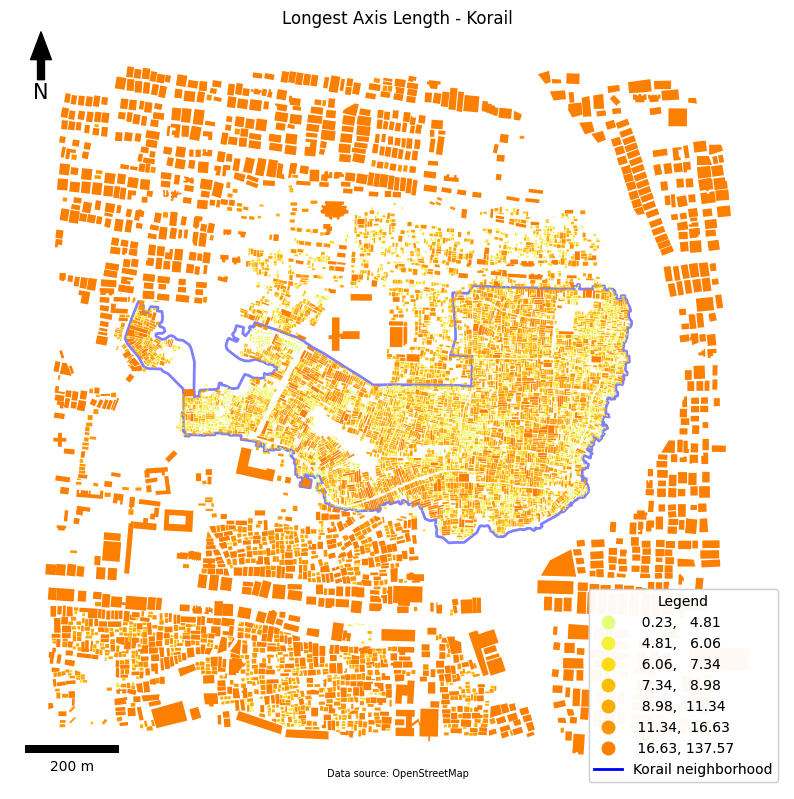

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

# Plot Korail edges
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', alpha=0.5, linewidth=2)
# Plot buildings with area column and legend
buildings_plot = buildings.plot(ax=ax, column='lal', legend=True, scheme='quantiles', k=7, cmap='Wistia',
                                legend_kwds={'loc': 'lower right', 'title': "Building Area (Quantiles)"})

# Manually create a legend entry for the Korail plot
korail_legend = Line2D([0], [0], color='blue', lw=2, label='Korail neighborhood')

ax.set_axis_off()

# Retrieve the existing legend from the buildings plot
leg = ax.get_legend()

# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []

# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')

# Remove the previous legend to avoid duplicates
leg.remove()

# Create combined legend with a title
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)



# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Show the plot
plt.title('Longest Axis Length - Korail')  # Adding a title to the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## **SPATIAL DISTRIBUTION METRICS**

# Distance to neighbours buidlings

Caculates the distance to neighbours buildings through queen contiguity weights of the first order capturing the relationship between immediate neighbours.Relationship between buildings is here represented by relationships between their tessellation cells.

In [ ]:
sw1 = mm.sw_high(k=1, gdf=tessellation, ids='uID')
buildings['neighbour_dist'] = mm.NeighborDistance(buildings, sw1, 'uID').series
buildings = buildings.dropna(subset=['neighbour_dist'])

<ipython-input-14-e5654393bf88>:1: FutureWarning: `momepy.sw_high` is deprecated. Replace it with .higher_order() method of libpysal.graph.Graph or pin momepy version <1.0. This class will be removed in 1.0. 
  sw1 = mm.sw_high(k=1, gdf=tessellation, ids='uID')
<ipython-input-14-e5654393bf88>:2: FutureWarning: Class based API like `momepy.NeighborDistance` is deprecated. Replace it with `momepy.neighbor_distance` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['neighbour_dist'] = mm.NeighborDistance(buildings, sw1, 'uID').series


  0%|          | 0/10709 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-15-a89165014103>:19: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


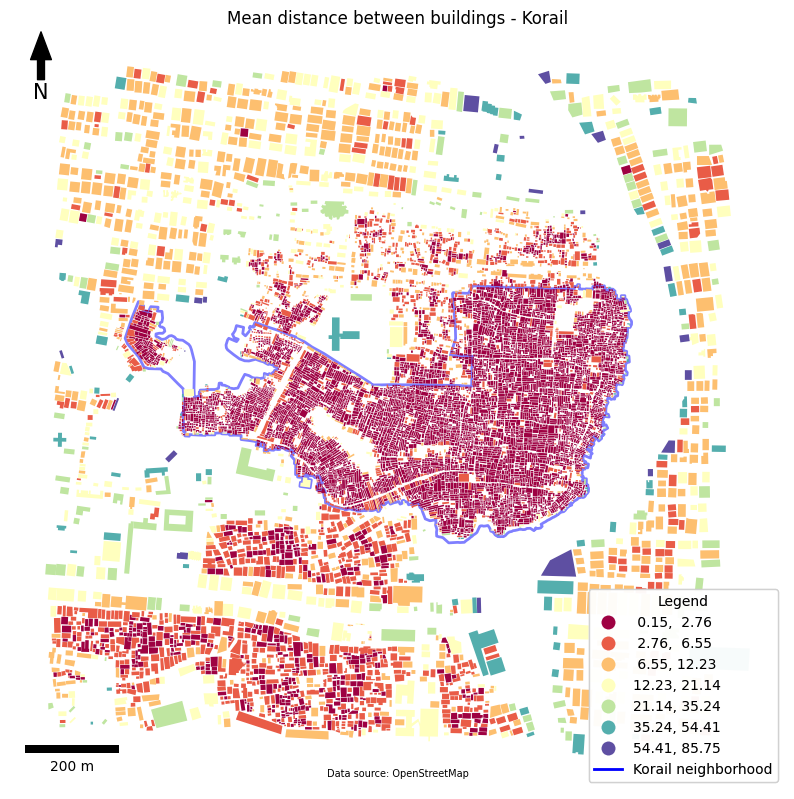

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

# Plot Korail edges
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', alpha=0.5, linewidth=2)
# Plot buildings with area column and legend
buildings_plot = buildings.plot(ax=ax, column='neighbour_dist', scheme='naturalbreaks', legend=True, k=7, cmap='Spectral',
               legend_kwds={'loc': 'lower right', 'title': "Building Perimeter (Quantiles)"})

# Manually create a legend entry for the Korail plot
korail_legend = Line2D([0], [0], color='blue', lw=2, label='Korail neighborhood')

ax.set_axis_off()

# Retrieve the existing legend from the buildings plot
leg = ax.get_legend()

# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []

# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')

# Remove the previous legend to avoid duplicates
leg.remove()

# Create combined legend with a title
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)



# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Show the plot
plt.title('Mean distance between buildings - Korail')  # Adding a title to the plot
plt.show()

# Mean Interbuilding Distance

 Interbuilding distances are calculated between buildings on adjacent cells based on spatial_weights,

In [ ]:
MID = mm.MeanInterbuildingDistance(buildings, sw1,'uID')
buildings['mean_interbuilding_distance'] = MID.series


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-16-d2f1a476d11a>:1: FutureWarning: Class based API like `momepy.MeanInterbuildingDistance` is deprecated. Replace it with `momepy.mean_interbuilding_distance` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  MID = mm.MeanInterbuildingDistance(buildings, sw1,'uID')


Computing mean interbuilding distances...


  0%|          | 0/10698 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-17-dd2ea6248615>:19: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


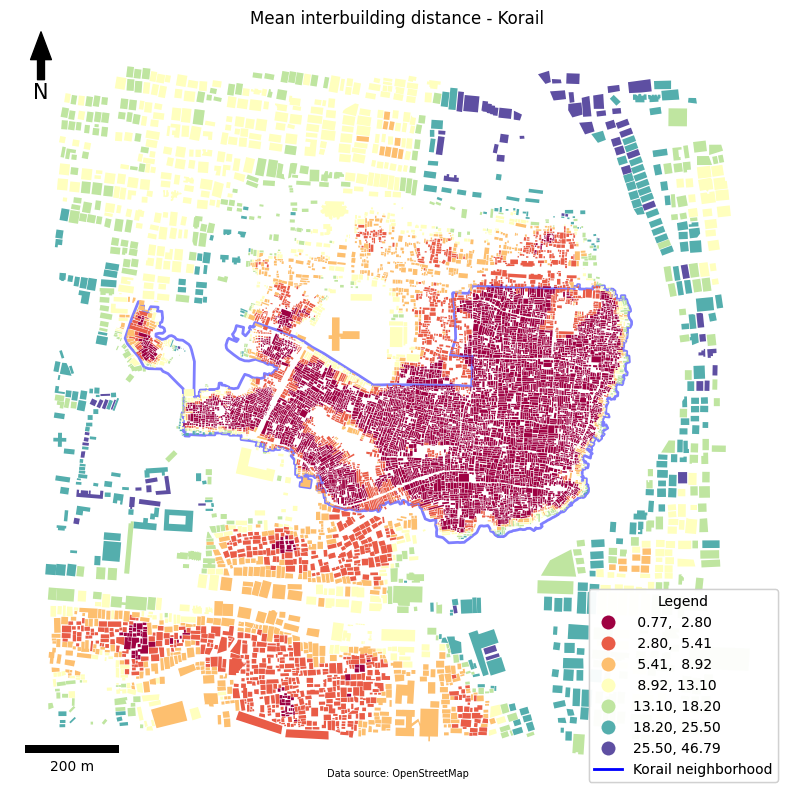

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

# Plot Korail edges
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', alpha=0.5, linewidth=2)
# Plot buildings with area column and legend
buildings_plot = buildings.plot(ax=ax, column='mean_interbuilding_distance', scheme='naturalbreaks', legend=True, k=7, cmap='Spectral',
               legend_kwds={'loc': 'lower right', 'title': "Building Perimeter (Quantiles)"})

# Manually create a legend entry for the Korail plot
korail_legend = Line2D([0], [0], color='blue', lw=2, label='Korail neighborhood')

ax.set_axis_off()

# Retrieve the existing legend from the buildings plot
leg = ax.get_legend()

# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []

# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')

# Remove the previous legend to avoid duplicates
leg.remove()

# Create combined legend with a title
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)


# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Show the plot
plt.title('Mean interbuilding distance - Korail')  # Adding a title to the plot
plt.show()



In [ ]:
print(buildings.columns)

Index(['addr:city', 'addr:housenumber', 'addr:postcode', 'addr:street',
       'building', 'name', 'note', 'office', 'website', 'geometry',
       'building:levels', 'smoking', 'phone', 'addr:country', 'addr:house',
       'addr:suburb', 'addr:word', 'amenity', 'building:material', 'name:bn',
       'name:en', 'place_of_worship', 'religion', 'addr:neighbourhood',
       'addr:housename', 'material', 'nodes', 'shop', 'wikidata', 'wikipedia',
       'wheelchair', 'tourism', 'description', 'brand', 'internet_access',
       'internet_access:fee', 'layer', 'email', 'capacity', 'cuisine',
       'takeaway', 'lift', 'structure', 'ruins', 'source', 'name:fr',
       'denomination', 'level', 'opening_hours', 'healthcare', 'addr:place',
       'addr:district', 'club', 'operator', 'sport', 'Type', 'delivery',
       'outdoor_seating', 'stars', 'building:condition', 'contact:facebook',
       'payment:american_express', 'payment:app', 'payment:cards',
       'payment:cash', 'payment:debit_cards',

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## **SHAPE METRICS**

# Circular compactness

measures the ratio of object area to the area of its smallest circumsribed circle.
This ratio indicates how efficiently the object's area fills the smallest circumscribed circle.
Values closer to 1 indicating a shape more similar to a perfect circle.

In [ ]:
blg_cc = mm.CircularCompactness(buildings)
buildings['circular_com'] = blg_cc.series

<ipython-input-19-8b89b561cc24>:1: FutureWarning: Class based API like `momepy.CircularCompactness` is deprecated. Replace it with `momepy.circular_compactness` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  blg_cc = mm.CircularCompactness(buildings)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-20-a5521f5ba435>:19: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


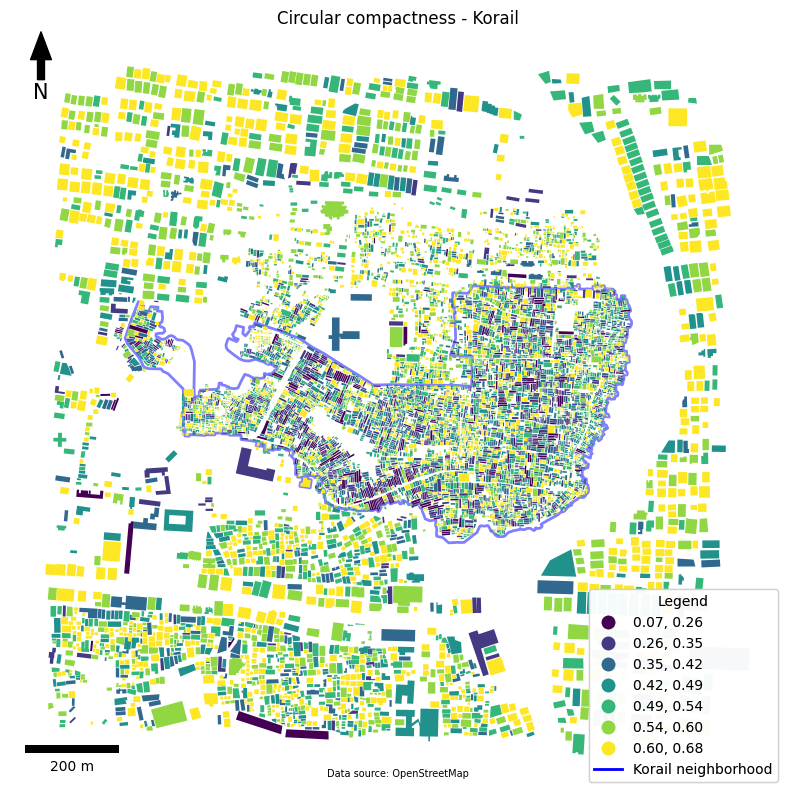

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

# Plot Korail edges
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', alpha=0.5, linewidth=2)
# Plot buildings with area column and legend
buildings_plot = buildings.plot(ax=ax, column='circular_com', scheme='naturalbreaks', legend=True, k=7, cmap='viridis',
               legend_kwds={'loc': 'lower right', 'title': "Building Perimeter (Quantiles)"})

# Manually create a legend entry for the Korail plot
korail_legend = Line2D([0], [0], color='blue', lw=2, label='Korail neighborhood')

ax.set_axis_off()

# Retrieve the existing legend from the buildings plot
leg = ax.get_legend()

# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []

# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')

# Remove the previous legend to avoid duplicates
leg.remove()

# Create combined legend with a title
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)


# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Show the plot
plt.title('Circular compactness - Korail')  # Adding a title to the plot
plt.show()

# Elongation

Elongation of its minimum bounding rectangle.
If the elongation is close to 1, the object is more or less square-shaped indicating little to no elongation.
If it is much greater than 1, the object is significantly elongated in one direction.

In [ ]:
blg_elongation = mm.Elongation(buildings)
buildings['elongation'] = blg_elongation.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-21-c0dd7d404bde>:1: FutureWarning: Class based API like `momepy.Elongation` is deprecated. Replace it with `momepy.elongation` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  blg_elongation = mm.Elongation(buildings)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-22-f528b46630e4>:19: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


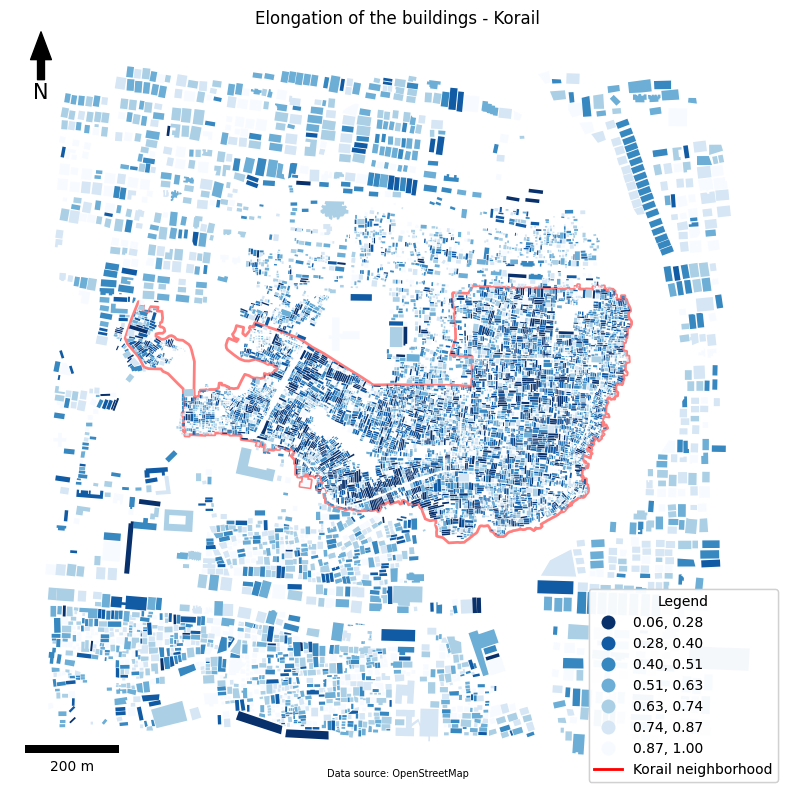

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

# Plot Korail edges
Korail.plot(ax=ax, edgecolor='red', facecolor='none', alpha=0.5, linewidth=2)
# Plot buildings with area column and legend
buildings_plot = buildings.plot(ax=ax, column='elongation', scheme='naturalbreaks', legend=True, k=7,  cmap='Blues_r',
               legend_kwds={'loc': 'lower right', 'title': "Building Perimeter (Quantiles)"})

# Manually create a legend entry for the Korail plot
korail_legend = Line2D([0], [0], color='red', lw=2, label='Korail neighborhood')

ax.set_axis_off()

# Retrieve the existing legend from the buildings plot
leg = ax.get_legend()

# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []

# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')

# Remove the previous legend to avoid duplicates
leg.remove()

# Create combined legend with a title
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)


# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Show the plot
plt.title('Elongation of the buildings - Korail')  # Adding a title to the plot
plt.show()


# Cell shapes

Calculates the compactness-weighted axis of each tessellation


In [ ]:
tes_cwa = mm.CompactnessWeightedAxis(tessellation)
tessellation['cwa'] = tes_cwa.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-23-66348a3ed6cd>:1: FutureWarning: Class based API like `momepy.CompactnessWeightedAxis` is deprecated. Replace it with `momepy.compactness_weighted_axis` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  tes_cwa = mm.CompactnessWeightedAxis(tessellation)
/usr/local/lib/python3.10/dist-packages/momepy/shape.py:1345: FutureWarning: Class based API like `momepy.LongestAxisLength` is deprecated. Replace it with `momepy.longest_axis_length` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  gdf["mm_la"] = LongestAxisLength(gdf)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-24-e7389e751bc0>:19: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


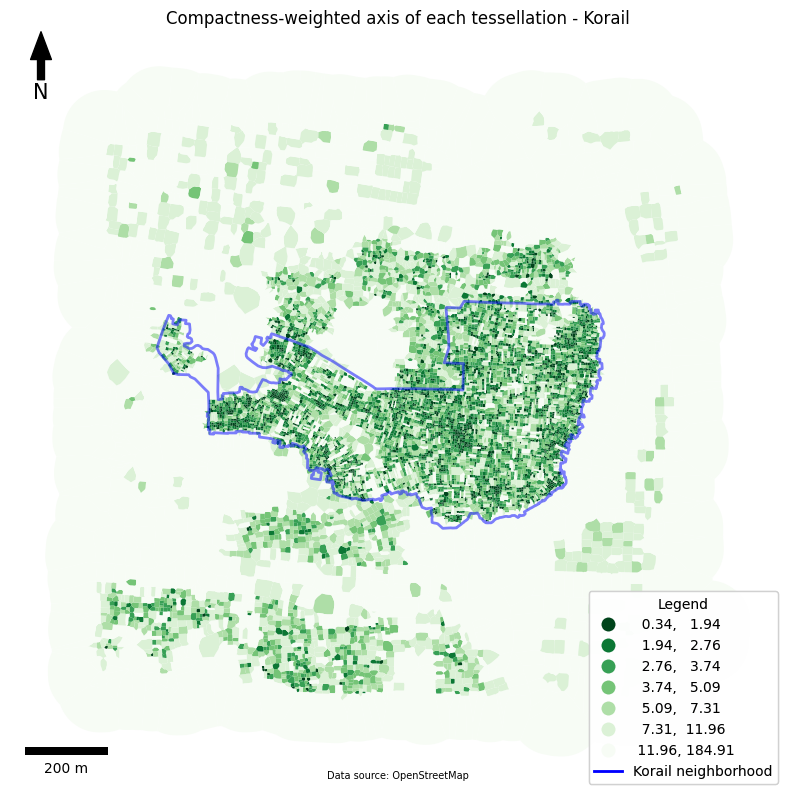

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))


# Plot tess with area column and legend
tessellation.plot(ax=ax, column='cwa', legend=True, scheme='quantiles', k=7, cmap='Greens_r',
                  legend_kwds={'loc': 'lower right', 'title': "compactness-weighted axi (Quantiles)"})
# Plot Korail edges
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', alpha=0.5, linewidth=2)
# Manually create a legend entry for the Korail plot
korail_legend = Line2D([0], [0], color='blue', lw=2, label='Korail neighborhood')

ax.set_axis_off()

# Retrieve the existing legend from the buildings plot
leg = ax.get_legend()

# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []

# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')

# Remove the previous legend to avoid duplicates
leg.remove()

# Create combined legend with a title
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)


# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Show the plot
plt.title('Compactness-weighted axis of each tessellation - Korail')  # Adding a title to the plot
plt.show()




## Covered Area Ratio

In [ ]:
tessellation['area'] = mm.Area(tessellation).series
buildings['area'] = mm.Area(buildings).series
tess_car = mm.AreaRatio(tessellation, buildings, 'area', 'area', 'uID')
tessellation['CAR'] = tess_car.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-25-b17033dd914d>:1: FutureWarning: `momepy.Area` is deprecated. Replace it with `.area` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  tessellation['area'] = mm.Area(tessellation).series
<ipython-input-25-b17033dd914d>:2: FutureWarning: `momepy.Area` is deprecated. Replace it with `.area` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  buildings['area'] = mm.Area(buildings).series
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

In [ ]:
tess_car = mm.AreaRatio(tessellation, buildings,
                            mm.Area(tessellation).series,
                            mm.Area(buildings).series, 'uID')
tessellation['CAR'] = tess_car.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-26-2fcb44c4cc41>:2: FutureWarning: `momepy.Area` is deprecated. Replace it with `.area` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  mm.Area(tessellation).series,
<ipython-input-26-2fcb44c4cc41>:3: FutureWarning: `momepy.Area` is deprecated. Replace it with `.area` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  mm.Area(buildings).series, 'uID')
<ipython-input-26-2fcb44c4cc41>:1: FutureWarning: `momepy.AreaRatio` is deprecated. Replace it with a direct division of areas or momepy.describe_agg() or pin momepy version <1.0. This cl

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-27-63e28eb24bcf>:20: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


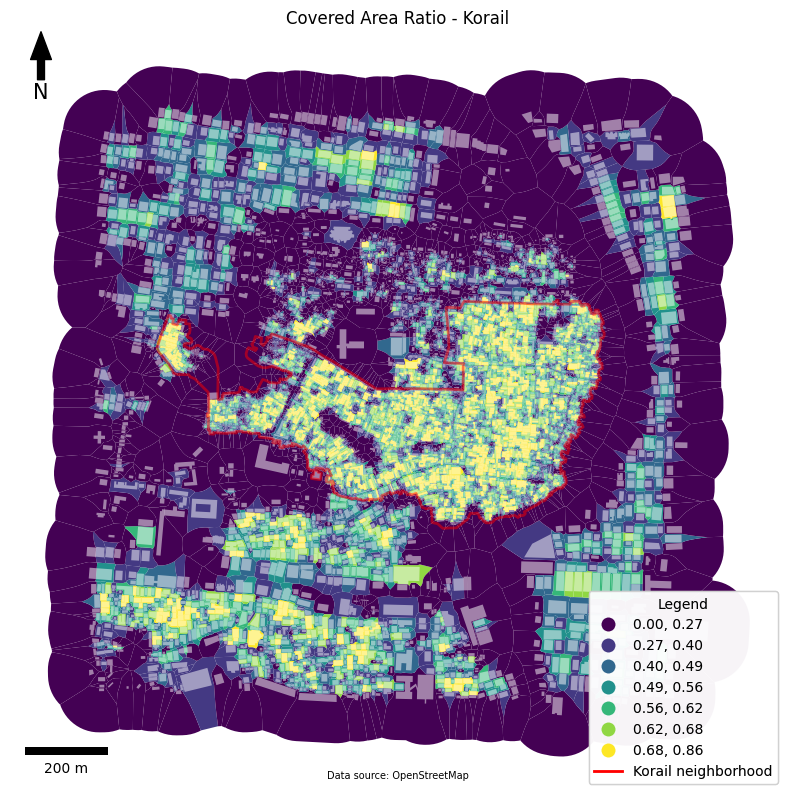

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))


# Plot tess with area column and legend
tessellation.plot(ax=ax, column='CAR', legend=True, scheme='quantiles', k=7, cmap='viridis',
                  legend_kwds={'loc': 'lower right', 'title': "compactness-weighted axi (Quantiles)"})
buildings.plot(ax=ax, color='white', alpha=0.5)
# Plot Korail edges
Korail.plot(ax=ax, edgecolor='red', facecolor='none', alpha=0.5, linewidth=2)
# Manually create a legend entry for the Korail plot
korail_legend = Line2D([0], [0], color='red', lw=2, label='Korail neighborhood')

ax.set_axis_off()

# Retrieve the existing legend from the buildings plot
leg = ax.get_legend()

# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []

# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')

# Remove the previous legend to avoid duplicates
leg.remove()

# Create combined legend with a title
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)


# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Show the plot
plt.title('Covered Area Ratio - Korail')  # Adding a title to the plot
plt.show()


# Tesselation Area

In [ ]:
tes_area = mm.Area(tessellation)
tessellation['tes_area'] = tes_area.series

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-28-76891545b88b>:1: FutureWarning: `momepy.Area` is deprecated. Replace it with `.area` attribute of a GeoDataFrame or pin momepy version <1.0. This class will be removed in 1.0. 
  tes_area = mm.Area(tessellation)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-29-1b92644e3bd6>:20: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


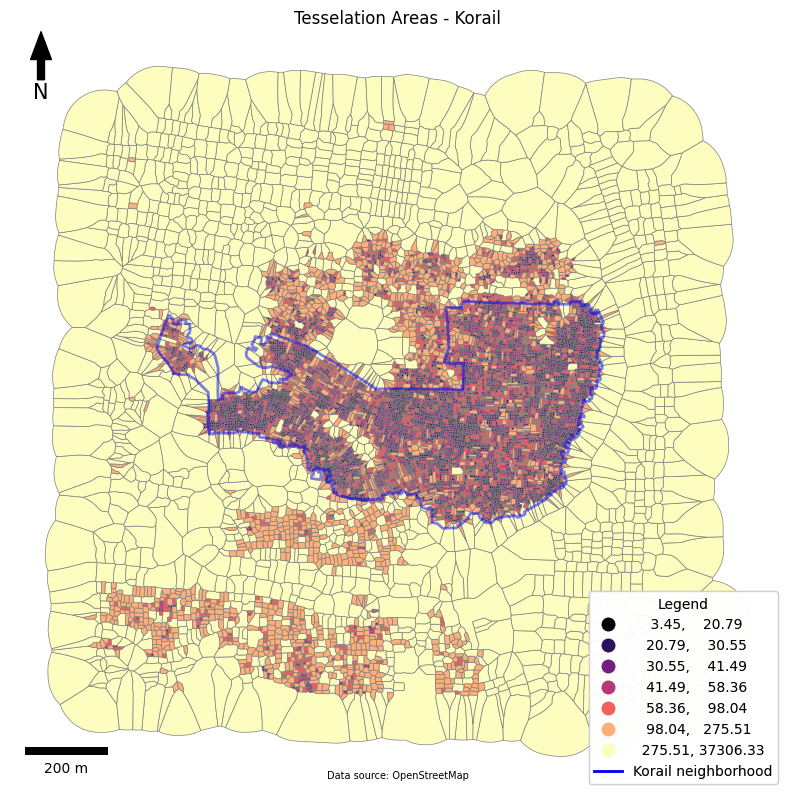

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))


# Plot tess with area column and legend
tessellation.plot(ax=ax, edgecolor='grey', linewidth=0.5, column='tes_area', legend=True, scheme='quantiles', k=7, cmap='magma', alpha=1,
                  legend_kwds={'loc': 'lower right', 'title': "compactness-weighted axi (Quantiles)"})
# buildings.plot(ax=ax, color='white', alpha=0.2)
# Plot Korail edges
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', alpha=0.5, linewidth=2)
# Manually create a legend entry for the Korail plot
korail_legend = Line2D([0], [0], color='blue', lw=2, label='Korail neighborhood')

ax.set_axis_off()

# Retrieve the existing legend from the buildings plot
leg = ax.get_legend()

# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []

# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')

# Remove the previous legend to avoid duplicates
leg.remove()

# Create combined legend with a title
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)


# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Show the plot
plt.title('Tesselation Areas - Korail')  # Adding a title to the plot
plt.show()

In [ ]:
print(tessellation.head())

         uID                                           geometry        cwa  \
134      134  POLYGON ((236254.382 2631984.021, 236254.652 2...  37.682791   
697      698  POLYGON ((236352.992 2632081.597, 236353.542 2...  32.969564   
120      120  POLYGON ((236340.219 2632126.925, 236340.241 2...  21.506144   
10178  10189  POLYGON ((236368.711 2632129.824, 236368.559 2...  13.720441   
718      719  POLYGON ((236360.000 2632169.682, 236359.500 2...  17.711571   

               area       CAR      tes_area  
134    18052.371237  0.055739  18052.371237  
697     1445.738915  0.387970   1445.738915  
120     1333.567369  0.601259   1333.567369  
10178    956.003740  0.383726    956.003740  
718     1365.745887  0.466501   1365.745887  


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bo

# Fractal dimension

A fractal dimension greater than 1 for a 2-dimensional patch indicates a departure
from euclidean geometry (that is, an increase in shape complexity).

In [ ]:
buildings['fractal'] = mm.FractalDimension(buildings,'area', 'perimeter').series
buildings.fractal[0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-31-c2e6bfadba41>:1: FutureWarning: Class based API like `momepy.FractalDimension` is deprecated. Replace it with `momepy.fractal_dimension` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['fractal'] = mm.FractalDimension(buildings,'area', 'perimeter').series
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user

1.027646024125731

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-32-2c48e244290c>:20: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


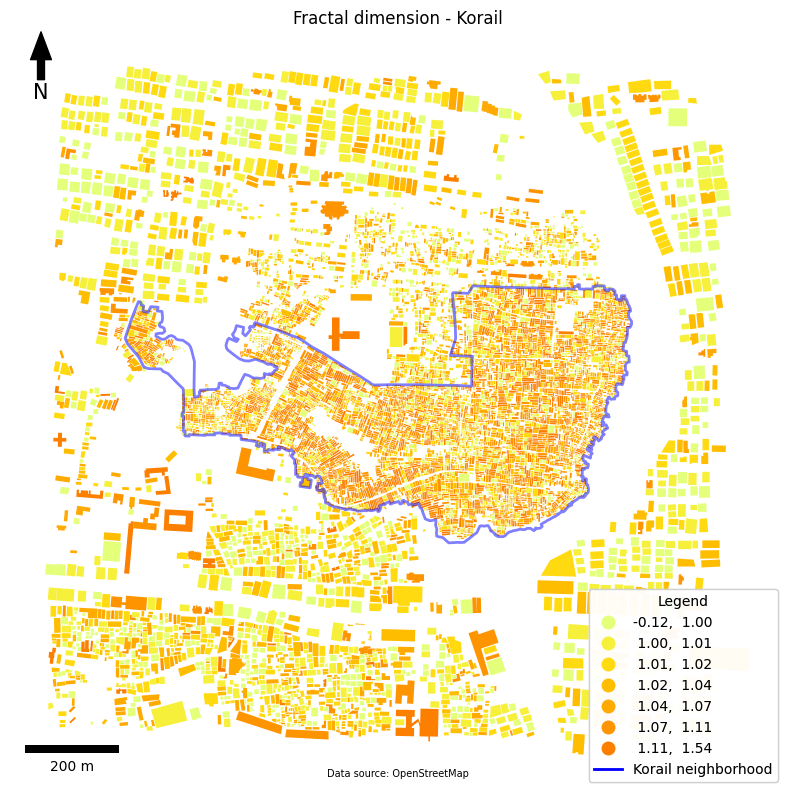

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))


# Plot tess with area column and legend
buildings.plot(ax=ax, column='fractal', legend=True, scheme='quantiles', k=7, cmap='Wistia',
                  legend_kwds={'loc': 'lower right', 'title': "compactness-weighted axi (Quantiles)"})
# buildings.plot(ax=ax, color='white', alpha=0.2)
# Plot Korail edges
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', alpha=0.5, linewidth=2)
# Manually create a legend entry for the Korail plot
korail_legend = Line2D([0], [0], color='blue', lw=2, label='Korail neighborhood')

ax.set_axis_off()

# Retrieve the existing legend from the buildings plot
leg = ax.get_legend()

# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []

# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')

# Remove the previous legend to avoid duplicates
leg.remove()

# Create combined legend with a title
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)


# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Show the plot
plt.title('Fractal dimension - Korail')  # Adding a title to the plot
plt.show()

# TOPOLOGY METRICS

# Obtain basic dataset = Centroids of the buildings

In [ ]:

# Centroids of the buildings
def multipolygon_centroid(geom):
    if geom.geom_type == 'MultiPolygon':
        return geom.convex_hull.centroid
    else:
        return geom.centroid

buildings['centroid'] = buildings.geometry.apply(multipolygon_centroid)

# Create a GeoDataFrame for the centroids with uID
centroids_gdf = gpd.GeoDataFrame({
    'uID': buildings['uID'],
    'geometry': buildings['centroid']
}, crs=buildings.crs)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
print(buildings.columns)

Index(['addr:city', 'addr:housenumber', 'addr:postcode', 'addr:street',
       'building', 'name', 'note', 'office', 'website', 'geometry',
       'building:levels', 'smoking', 'phone', 'addr:country', 'addr:house',
       'addr:suburb', 'addr:word', 'amenity', 'building:material', 'name:bn',
       'name:en', 'place_of_worship', 'religion', 'addr:neighbourhood',
       'addr:housename', 'material', 'nodes', 'shop', 'wikidata', 'wikipedia',
       'wheelchair', 'tourism', 'description', 'brand', 'internet_access',
       'internet_access:fee', 'layer', 'email', 'capacity', 'cuisine',
       'takeaway', 'lift', 'structure', 'ruins', 'source', 'name:fr',
       'denomination', 'level', 'opening_hours', 'healthcare', 'addr:place',
       'addr:district', 'club', 'operator', 'sport', 'Type', 'delivery',
       'outdoor_seating', 'stars', 'building:condition', 'contact:facebook',
       'payment:american_express', 'payment:app', 'payment:cards',
       'payment:cash', 'payment:debit_cards',

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


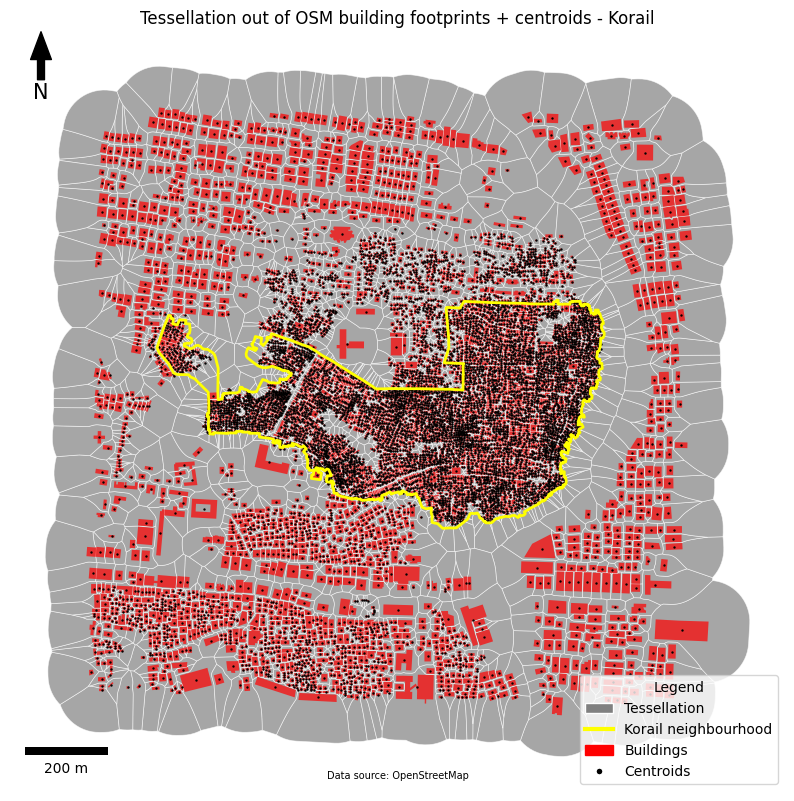

In [ ]:
# Create the plot
f, ax = plt.subplots(figsize=(10, 10))

tessellation.plot(ax=ax, edgecolor='white', linewidth=0.5, facecolor='grey', alpha=.7)

buildings.plot(ax=ax, color='red', alpha=.7)
centroids_gdf.plot(ax=ax, color='black', markersize=0.5, marker='o', label='Centroids')
Korail.plot(ax=ax, edgecolor='yellow', facecolor='none', linewidth=2)

# Create legend elements
legend_elements = [
    Patch(facecolor='grey', edgecolor='white', label='Tessellation'),
    Line2D([0], [0], color='yellow', lw=3, label='Korail neighbourhood'),
    Patch(facecolor='red', edgecolor='red', label='Buildings'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=5, label='Centroids')
]

# Add the legend to the plot
ax.legend(handles=legend_elements, loc='lower right', title='Legend')

# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

# Title and axis off
plt.title('Tessellation out of OSM building footprints + centroids - Korail')
ax.set_axis_off()
plt.show()

In [ ]:
total_nodes = len(centroids_gdf)
print(f"Total number of nodes: {total_nodes}")
total_buildings = len(buildings)
print(f"Total number of buildings: {total_buildings}")

Total number of nodes: 10698
Total number of buildings: 10698


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Delaunay Triangulation

In [ ]:
#Coordinates based on the centroids of the buildings
coordinates = np.column_stack((centroids_gdf.geometry.x, centroids_gdf.geometry.y))

from scipy.spatial import Delaunay
tri = Delaunay(coordinates)

# Create a networkx graph out of the Delaunay triangulation
G = nx.Graph()

# Add edges to the graph
for simplex in tri.simplices:
    for i in range(3):
        for j in range(i + 1, 3):
            G.add_edge(simplex[i], simplex[j])

# Get positions of the nodes for plotting
positions = {i: (coordinates[i, 0], coordinates[i, 1]) for i in range(len(coordinates))}

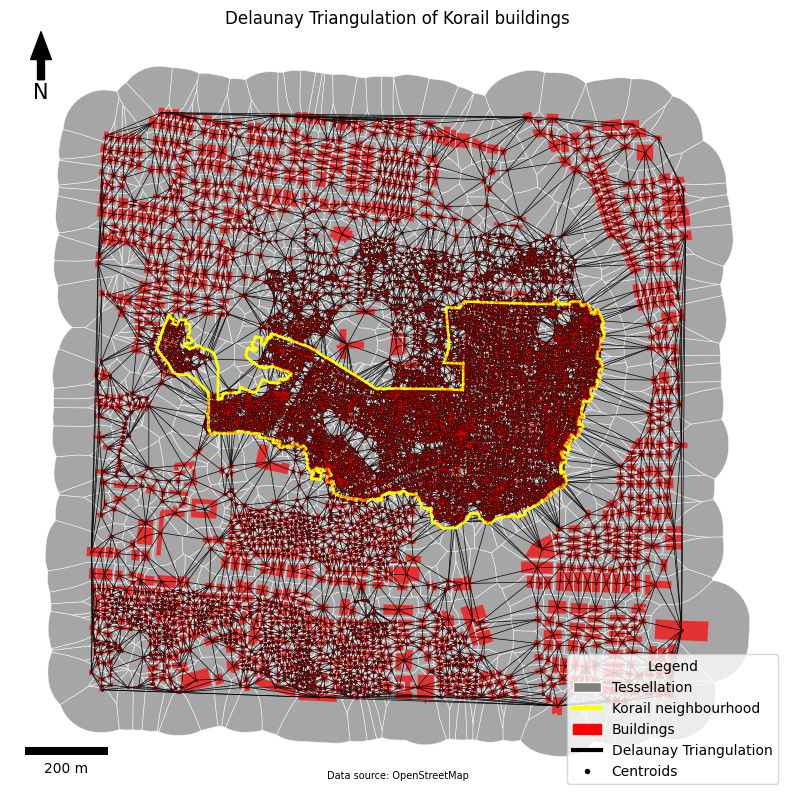

In [ ]:
# Plot
f, ax = plt.subplots(figsize=(10, 10))

tessellation.plot(ax=ax, edgecolor='white', linewidth=0.5, facecolor='grey', alpha=.7)

buildings.plot(ax=ax, color='red', alpha=.7)
# Edges of the Delaunay triangulation
nx.draw(G, pos=positions, node_size=0.1, node_color='red', edge_color='black', width=0.5)

centroids_gdf.plot(ax=ax, color='black', markersize=1, marker='o', label='Centroids')


Korail.plot(ax=ax, edgecolor='yellow', facecolor='none', linewidth=2)

# Create legend elements
legend_elements = [
    Patch(facecolor='grey', edgecolor='white', label='Tessellation'),
    Line2D([0], [0], color='yellow', lw=3, label='Korail neighbourhood'),
    Patch(facecolor='red', edgecolor='red', label='Buildings'),
    Line2D([0], [0], color='black', lw=3, label='Delaunay Triangulation'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=5, label='Centroids')
]

# Add the legend to the plot
ax.legend(handles=legend_elements, loc='lower right', title='Legend')

# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)
plt.title('Delaunay Triangulation of Korail buildings')
plt.show()

# Weighted distance

In [ ]:
# Edges to the graph with weights based on Euclidean distance
for simplex in tri.simplices:
    for i in range(3):
        for j in range(i + 1, 3):
            p1 = coordinates[simplex[i]]
            p2 = coordinates[simplex[j]]
            distance = euclidean(p1, p2) #scipy
            G.add_edge(simplex[i], simplex[j], weight=distance) #networkx

# Extract edges with their weights
edges = []
for u, v, data in G.edges(data=True):
    line = LineString([coordinates[u], coordinates[v]])
    edges.append({'geometry': line, 'weight': data['weight']})

# Geodataframe of edges
gdf_edges = gpd.GeoDataFrame(edges)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<ipython-input-40-8e789e3b139c>:10: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


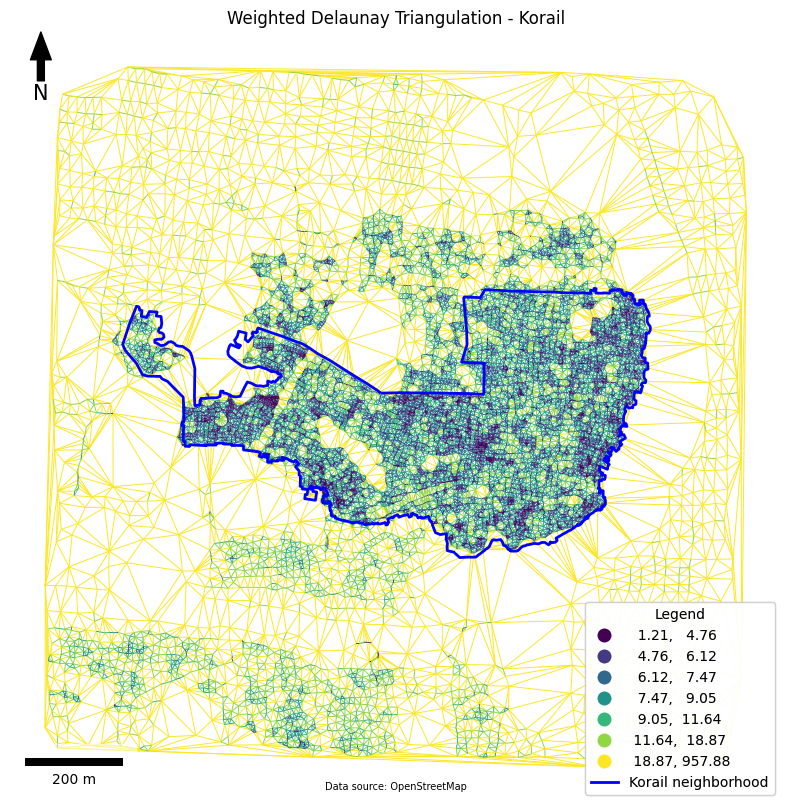

In [ ]:

f, ax = plt.subplots(figsize=(10, 10))

gdf_edges.plot(ax=ax, column='weight', legend=True, scheme='quantiles', k=7, cmap='viridis', linewidth=0.7, zorder=0,
                  legend_kwds={'loc': 'lower right', 'title': "Weighted Delaunay Triangulation (Quantiles)"})
korail_legend = Line2D([0], [0], color='blue', lw=2, label='Korail neighborhood')
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
leg = ax.get_legend()
# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []
# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')


# Create combined legend
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)

# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)


plt.title('Weighted Delaunay Triangulation - Korail')
ax.set_axis_off()
plt.show()

In [ ]:
# Initialize a dictionary to store average weighted distances for each node
node_avg_weighted_distance = {}

# Loop through each node in the graph
for node in G.nodes():
    # Get all neighboring nodes (adjacent nodes)
    neighbors = list(G.neighbors(node))

    # Calculate average weighted distance
    total_weighted_distance = 0.0
    count = 0

    # Iterate over edges connecting the node to its neighbors
    for neighbor in neighbors:
        # Get the weight of the edge between node and neighbor
        weight = G[node][neighbor]['weight']

        # Accumulate weighted distance
        total_weighted_distance += weight
        count += 1

    # Calculate average weighted distance for the node
    if count > 0:
        avg_weighted_distance = total_weighted_distance / count
    else:
        avg_weighted_distance = 0.0

    # Store the average weighted distance in the dictionary
    node_avg_weighted_distance[node] = avg_weighted_distance

# Print or use node_avg_weighted_distance as needed
print(node_avg_weighted_distance)

{356: 24.217564549267657, 9887: 67.88384768364965, 396: 33.13780978676762, 308: 37.26423467642473, 305: 62.67115614409008, 1303: 202.66558700714626, 9731: 87.01439952445362, 9730: 46.13608370128499, 9747: 63.85428578587772, 9746: 23.974852151701334, 604: 29.118596616686794, 783: 152.50376580317237, 10371: 111.10251825274922, 1192: 143.15696650497603, 557: 172.3550993824794, 996: 140.1654816161992, 1165: 102.8420221816215, 9852: 86.60177226874389, 10: 240.34713008075343, 1097: 69.10565120152044, 1197: 79.62208719160509, 145: 42.16658055412134, 144: 35.12395249024129, 522: 200.7113118952739, 526: 186.7224530008543, 0: 220.91263926464416, 9733: 123.52461519048484, 459: 71.89063104210695, 1186: 29.729858491046475, 9889: 30.119706482198414, 411: 22.75858563054228, 422: 29.37552739549588, 9885: 29.973418104539387, 1019: 34.528786321588534, 1004: 80.72240220145235, 998: 89.40155508077876, 1006: 34.466520739925436, 537: 68.7158140355982, 997: 39.15554736283214, 538: 58.87011915325132, 1128: 46

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Ensure that the GeoDataFrame indices match the graph nodes
centroids_gdf = centroids_gdf.reset_index(drop=True)

# Map the average weighted distances to the GeoDataFrame
centroids_gdf['avg_weighted_distance'] = centroids_gdf.index.map(node_avg_weighted_distance)

# Verify the mapping
print(centroids_gdf[['avg_weighted_distance']].head())




   avg_weighted_distance
0             220.912639
1              41.047750
2              72.471329
3              36.244606
4              38.779486


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-43-f2440330685f>:11: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


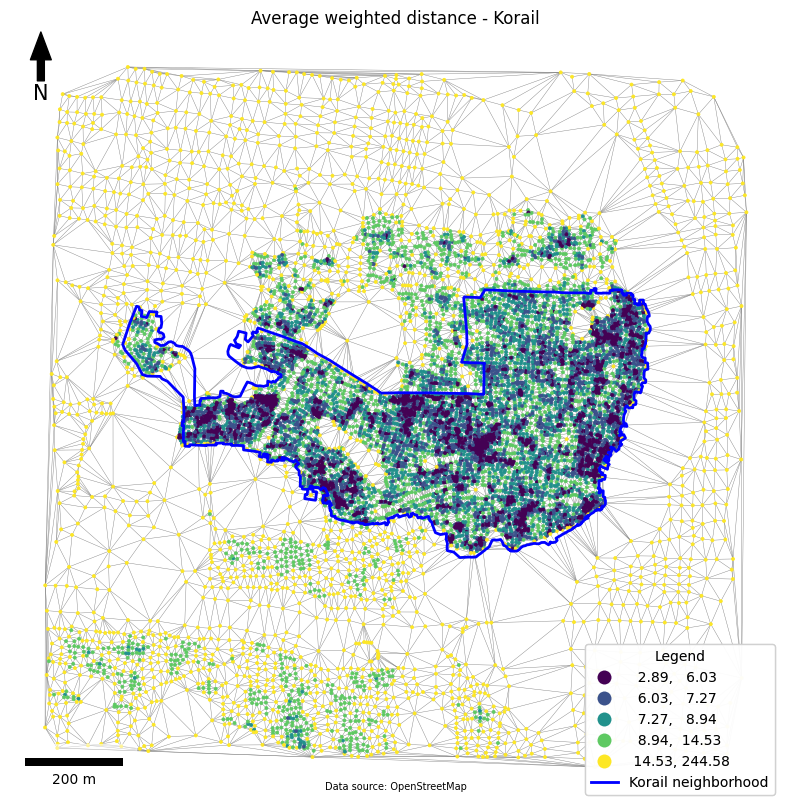

In [ ]:
f, ax = plt.subplots(figsize=(10, 10))

centroids_gdf.plot(ax=ax, column='avg_weighted_distance',  legend=True, scheme='quantiles', cmap='viridis', markersize=5, linewidth=0.5,
                       legend_kwds={'loc': 'lower right', 'title': "A_W_Distance"})
gdf_edges.plot(ax=ax, color='grey', linewidth=0.3, zorder=0)
korail_legend = Line2D([0], [0], color='blue', lw=2, label='Korail neighborhood')
Korail.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=2)
leg = ax.get_legend()
# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []
# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')


# Create combined legend
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)

# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)


plt.title('Average weighted distance - Korail')
ax.set_axis_off()
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
total_nodes = len(centroids_gdf)
print(f"Total number of nodes: {total_nodes}")
#same amount of nodes to buildings :)

Total number of nodes: 10698


In [ ]:
print(buildings.columns)

Index(['addr:city', 'addr:housenumber', 'addr:postcode', 'addr:street',
       'building', 'name', 'note', 'office', 'website', 'geometry',
       'building:levels', 'smoking', 'phone', 'addr:country', 'addr:house',
       'addr:suburb', 'addr:word', 'amenity', 'building:material', 'name:bn',
       'name:en', 'place_of_worship', 'religion', 'addr:neighbourhood',
       'addr:housename', 'material', 'nodes', 'shop', 'wikidata', 'wikipedia',
       'wheelchair', 'tourism', 'description', 'brand', 'internet_access',
       'internet_access:fee', 'layer', 'email', 'capacity', 'cuisine',
       'takeaway', 'lift', 'structure', 'ruins', 'source', 'name:fr',
       'denomination', 'level', 'opening_hours', 'healthcare', 'addr:place',
       'addr:district', 'club', 'operator', 'sport', 'Type', 'delivery',
       'outdoor_seating', 'stars', 'building:condition', 'contact:facebook',
       'payment:american_express', 'payment:app', 'payment:cards',
       'payment:cash', 'payment:debit_cards',

# Spatial Joint MM and TP

In [ ]:
# Spatial join using geopandas.sjoin
# Merge buildings and centroids_gdf, ensuring we retain the geometry column
joined_gdf = gpd.GeoDataFrame(
    buildings.merge(centroids_gdf, on='uID', how='left', suffixes=('_building', '_centroid')),
    geometry='geometry_building',
    crs=buildings.crs
)

# Merge the result with the tessellation DataFrame
joined_gdf = joined_gdf.merge(tessellation, on='uID', how='left', suffixes=('', '_tessellation'))



# GROUND TRUTH DATA

Objective =  classification of OSM building data into slum / non slum buildings using the Korail neighbourhood polygon as a filter

In [ ]:
# Classify buildings as 'slum' if they are within the Korail polygon, else 'non-slum'
buildings['label'] = np.where(buildings.within(Korail_union), 'slum', 'non-slum')

print("Buildings with labels:")
# print(buildings.head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Buildings with labels:


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
ground_truth_gdf = buildings.copy()
ground_truth_gdf['label'] = np.where(buildings.within(Korail_union), 'slum', 'non-slum')

print("Buildings with labels:")
print(ground_truth_gdf.head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Buildings with labels:
                       addr:city         addr:housenumber addr:postcode  \
element_type osmid                                                        
way          24818506      Dhaka                      NaN          1212   
             229029081     Dhaka                       75           NaN   
             232880646       NaN                      NaN           NaN   
             262026526     Dhaka  17 (Red Crescent Tower)          1212   
             272930517     Dhaka             66 Mohakhali          1212   

                                           addr:street    building  \
element_type osmid                                                   
way          24818506   Bir Uttam A. K. Khandakar Road         yes   
             229029081                       Mohakhali  commercial   
             232880646                             NaN         yes   
             262026526  Bir Uttam A. K. Khandakar Road         yes   
             272930517  Bir Utt

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-49-f620363d6e7c>:13: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]


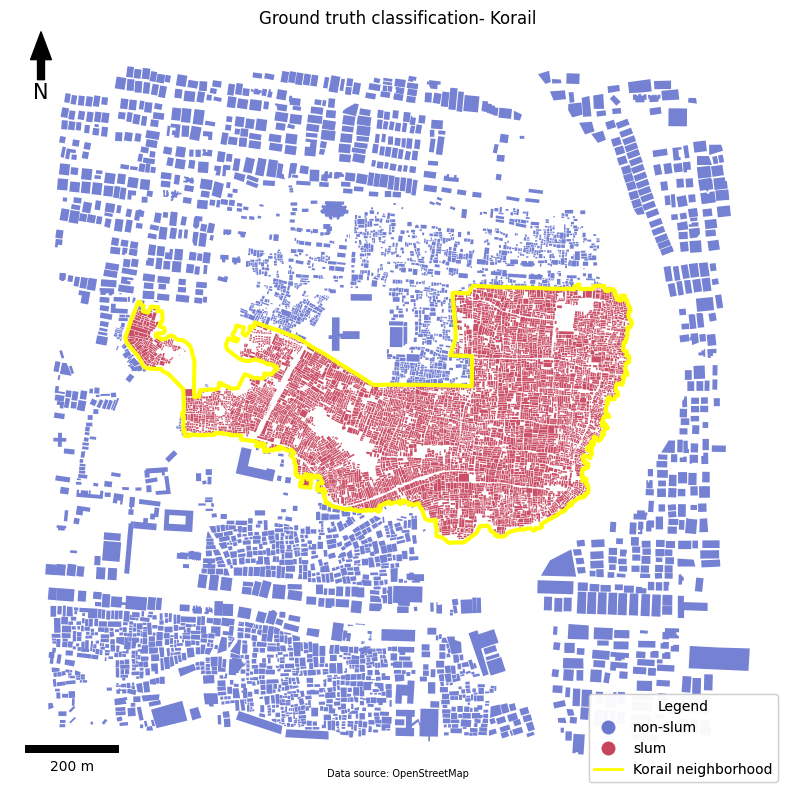

In [ ]:
# Plotting the data
f, ax = plt.subplots(figsize=(10, 10))

ground_truth_gdf.plot(ax=ax, column='label', cmap='coolwarm', alpha=.7, legend=True)
plt.title('Ground truth classification- Korail')

korail_legend = Line2D([0], [0], color='yellow', lw=2, label='Korail neighborhood')
Korail.plot(ax=ax, edgecolor='yellow', facecolor='none', linewidth=3)
leg = ax.get_legend()

# If the legend is not None, retrieve its handles and labels
if leg:
    handles, labels = leg.legendHandles, [text.get_text() for text in leg.get_texts()]
else:
    handles, labels = [], []
# Append the Korail legend entry
handles.append(korail_legend)
labels.append('Korail neighborhood')


# Create combined legend
combined_legend = ax.legend(handles=handles, labels=labels, loc='lower right', title='Legend')
ax.add_artist(combined_legend)

# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

ax.set_axis_off()
plt.show()

# Classification out of metrics w/ random forest

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bo

In [ ]:
import joblib
# Dataset
# buildings['label'] = buildings.intersects(Korail_union)
buildings['label'] = np.where(buildings.within(Korail_union), 'slum', 'non-slum')
features = joined_gdf[['area', 'perimeter', 'lal', 'neighbour_dist', 'mean_interbuilding_distance', 'circular_com', 'elongation', 'cwa', 'CAR', 'tes_area', 'fractal']]
labels = buildings['label']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.3, random_state=42)

# Train the Random Forest model
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Save the trained model
model_path = "/content/drive/MyDrive/cartography msc/Thesis TUM 2024/rf_model_korail_morpho.pkl"
joblib.dump(rf_classifier, model_path)

print("Model saved to", model_path)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Model saved to /content/drive/MyDrive/cartography msc/Thesis TUM 2024/rf_model_korail_morpho.pkl
Accuracy: 0.89
Confusion Matrix:
[[ 913  168]
 [ 170 1959]]
Classification Report:
              precision    recall  f1-score   support

    non-slum       0.84      0.84      0.84      1081
        slum       0.92      0.92      0.92      2129

    accuracy                           0.89      3210
   macro avg       0.88      0.88      0.88      3210
weighted avg       0.89      0.89      0.89      3210



In [ ]:
print(joined_gdf.columns)

Index(['addr:city', 'addr:housenumber', 'addr:postcode', 'addr:street',
       'building', 'name', 'note', 'office', 'website', 'geometry_building',
       'building:levels', 'smoking', 'phone', 'addr:country', 'addr:house',
       'addr:suburb', 'addr:word', 'amenity', 'building:material', 'name:bn',
       'name:en', 'place_of_worship', 'religion', 'addr:neighbourhood',
       'addr:housename', 'material', 'nodes', 'shop', 'wikidata', 'wikipedia',
       'wheelchair', 'tourism', 'description', 'brand', 'internet_access',
       'internet_access:fee', 'layer', 'email', 'capacity', 'cuisine',
       'takeaway', 'lift', 'structure', 'ruins', 'source', 'name:fr',
       'denomination', 'level', 'opening_hours', 'healthcare', 'addr:place',
       'addr:district', 'club', 'operator', 'sport', 'Type', 'delivery',
       'outdoor_seating', 'stars', 'building:condition', 'contact:facebook',
       'payment:american_express', 'payment:app', 'payment:cards',
       'payment:cash', 'payment:debi

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


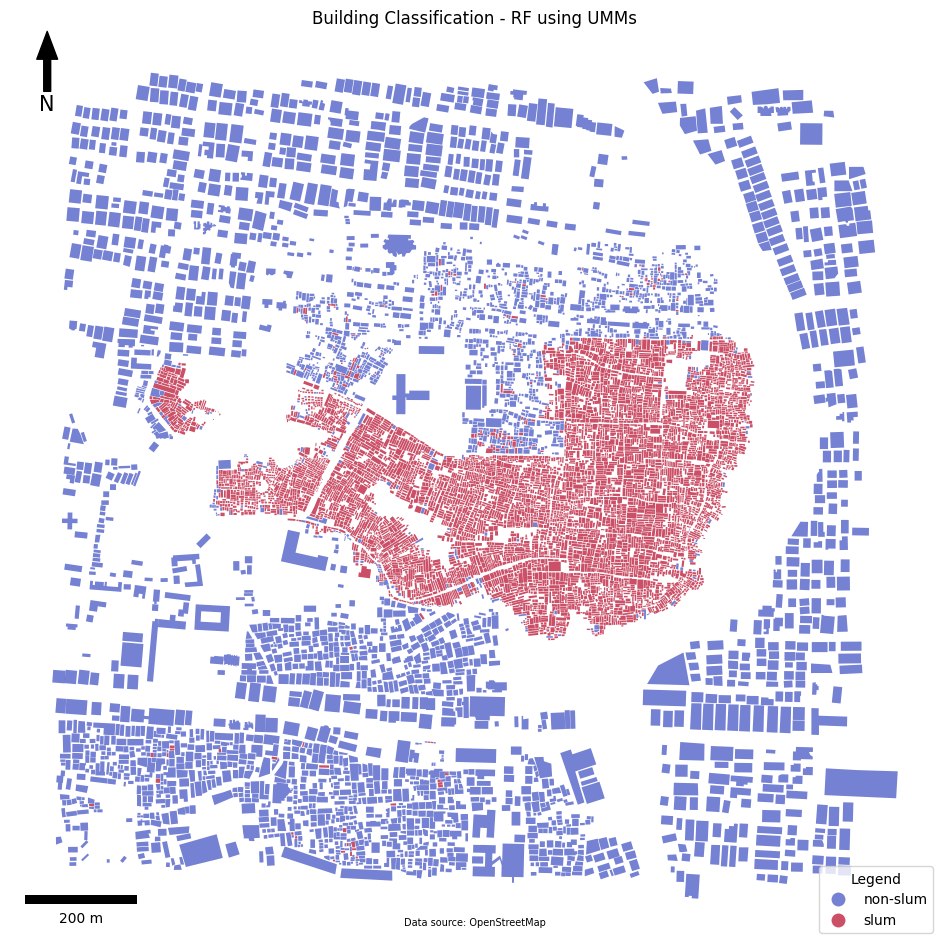

In [ ]:
# Classify buildings using the Random Forest model
predictions = rf_classifier.predict(features)

pred_label_mapping = {True: "slum", False: "non-slum"}
joined_gdf['pred_label'] = [pred_label_mapping[pred == 'slum'] for pred in predictions]

# Plot the classified buildings
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
joined_gdf.plot(column='pred_label', cmap='coolwarm', alpha=.7, legend=True, ax=ax,
                legend_kwds={'loc': 'lower right', 'title': "Legend"})

# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

plt.title('Building Classification - RF using UMMs')
ax.set_axis_off()
plt.show()

In [ ]:
# Predict on the entire dataset
predictions = rf_classifier.predict(features)

# Calculate the overall accuracy
overall_accuracy = accuracy_score(labels, predictions)
print(f"Overall Accuracy: {overall_accuracy * 100:.2f}%")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Overall Accuracy: 96.84%


In [ ]:
merged_df = pd.merge(joined_gdf[['uID', 'pred_label']], ground_truth_gdf[['uID', 'label']], on='uID', suffixes=('_pred', '_true'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print(merged_df.head())

   uID pred_label     label
0    0   non-slum  non-slum
1    1   non-slum  non-slum
2    2   non-slum  non-slum
3    3   non-slum  non-slum
4    4   non-slum  non-slum


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Number of correct predictions
correct_predictions = (merged_df['pred_label'] == merged_df['label']).sum()

# Total number of predictions
total_predictions = len(merged_df)

# Overall accuracy
o_accuracy = correct_predictions / total_predictions

print(f"Overall Accuracy: {o_accuracy * 100:.2f}%")

Overall Accuracy: 96.84%


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


WITH TOPOLOGY METRIC

In [ ]:
import joblib
# Dataset
buildings['label'] = np.where(buildings.within(Korail_union), 'slum', 'non-slum')
features = joined_gdf[['area', 'perimeter', 'lal', 'neighbour_dist', 'mean_interbuilding_distance', 'circular_com', 'elongation', 'cwa', 'CAR', 'tes_area', 'fractal', 'avg_weighted_distance']]
labels = buildings['label']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.3, random_state=42)

# Train the Random Forest model
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)


# Save the trained model
model_path = "/content/drive/MyDrive/cartography msc/Thesis TUM 2024/rf_model_korail_topo.pkl"
joblib.dump(rf_classifier, model_path)

print("Model saved to", model_path)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Model saved to /content/drive/MyDrive/cartography msc/Thesis TUM 2024/rf_model_korail_topo.pkl
Accuracy: 0.90
Confusion Matrix:
[[ 916  165]
 [ 146 1983]]
Classification Report:
              precision    recall  f1-score   support

    non-slum       0.86      0.85      0.85      1081
        slum       0.92      0.93      0.93      2129

    accuracy                           0.90      3210
   macro avg       0.89      0.89      0.89      3210
weighted avg       0.90      0.90      0.90      3210



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


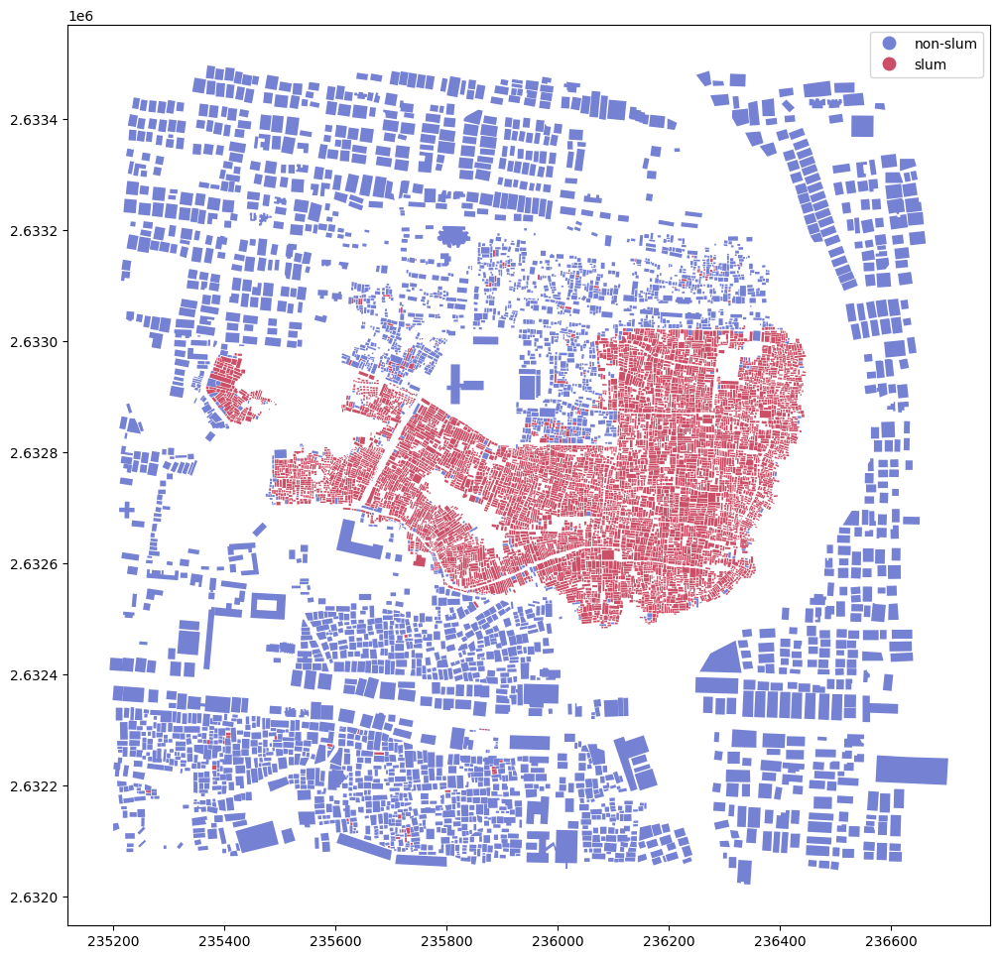

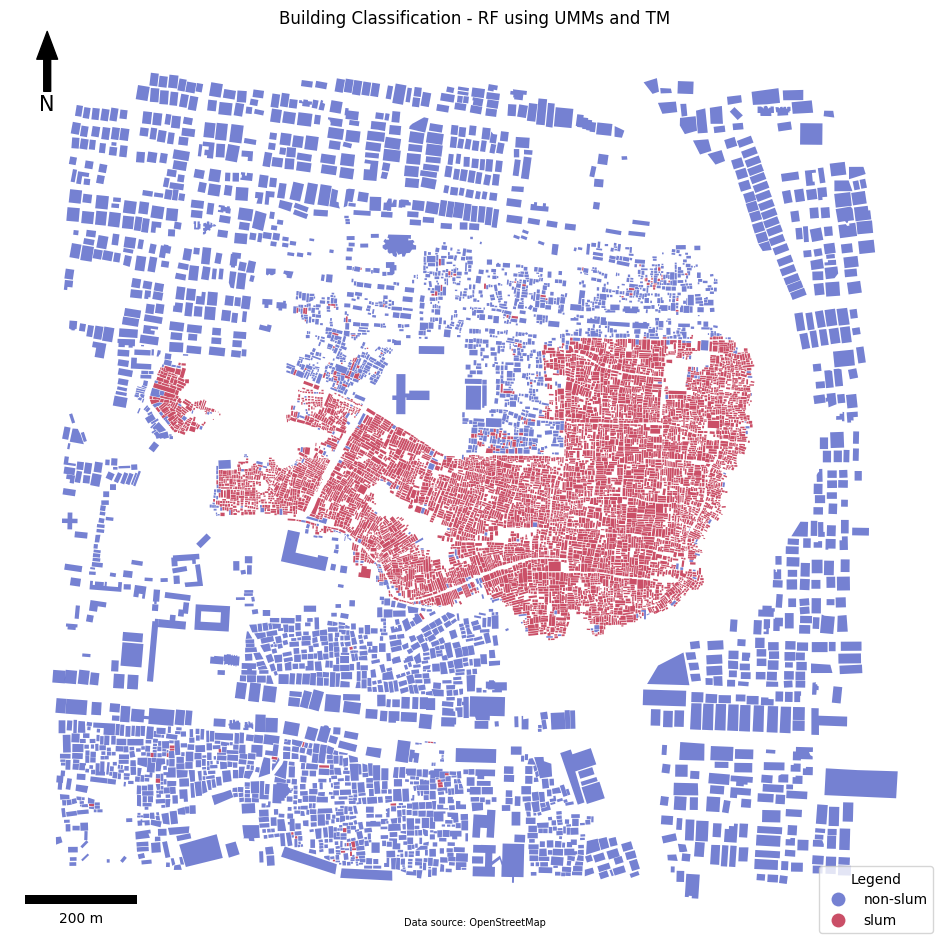

In [ ]:
# Compute the counts of buildings per label
label_counts = joined_gdf['pred_label'].value_counts()

# Plot the classified buildings
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
joined_gdf.plot(column='pred_label', cmap='coolwarm', alpha=.7, legend=True, ax=ax)

# Plot the classified buildings
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
joined_gdf.plot(column='pred_label', cmap='coolwarm', alpha=.7, legend=True, ax=ax,
                legend_kwds={'loc': 'lower right', 'title': "Legend"})

# Add scale bar with transparency
scalebar = ScaleBar(1, location='lower left', pad=1, box_alpha=0.5)
ax.add_artist(scalebar)

# Add north arrow with customized design
x, y, arrow_length = 0.04, 1, 0.08
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', headwidth=15, headlength=20, width=5),
            ha='center', va='center', fontsize=15,
            xycoords=ax.transAxes)

# Add resource text
plt.text(0.5, 0.02, 'Data source: OpenStreetMap', horizontalalignment='center',
         verticalalignment='center', transform=ax.transAxes, fontsize=7)

plt.title('Building Classification - RF using UMMs and TM')
ax.set_axis_off()
plt.show()

In [ ]:
print(joined_gdf['pred_label'].value_counts())

pred_label
slum        7053
non-slum    3645
Name: count, dtype: int64


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Predict on the entire dataset
predictions = rf_classifier.predict(features)

# Calculate the overall accuracy
overall_accuracy = accuracy_score(labels, predictions)
print(f"Overall Accuracy: {overall_accuracy * 100:.2f}%")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Overall Accuracy: 97.09%
